In [1]:
import pandas as pd
from googletrans.client import Translator
from transformers import pipeline
import re
import warnings
warnings.filterwarnings('ignore')
from wordcloud import WordCloud
import nltk
from nltk.corpus import stopwords
from nltk import sent_tokenize, word_tokenize
from wordcloud import WordCloud, STOPWORDS
from Sastrawi.Stemmer.StemmerFactory import StemmerFactory
from textblob import TextBlob
import matplotlib.pyplot as plt
import seaborn as sns
import string


# Import Data

In [2]:
df = pd.read_excel('full.xlsx')
df

,Date,komentar,Kategori,tipe
0,2020-07-23,SOTK mohon diperjelas agar tidak ada ranah yg ...,Institusi,dosen
1,2020-07-23,Semoga pelayanannya semakin baik,Institusi,dosen
2,2020-07-23,Semoga makin jaya,Institusi,dosen
3,2020-07-23,"Untuk senantiasa fokus pada tujuan, insyaalloh...",Institusi,dosen
4,2020-07-23,"Supaya yang belum pegtap bisa segera pegtap, t...",CapEx,dosen
...,...,...,...,...
385,2023-03-16,terima kasih sudah bagus tapi komunikasi untuk...,Institusi,dosen
386,2023-03-16,perlu samakan persepsi melalui komunikasi yang...,OpEx,dosen
387,2023-03-17,perlu samakan persepsi melalui komunikasi yang...,OpEx,dosen
388,2023-03-20,Sangat baik,Institusi,dosen


# Wordcloud Sebelum Cleaning

In [3]:
all_text = " ".join(tweet for tweet in df["komentar"])

wordcloud = WordCloud(background_color="white", width=800, height=400).generate(
    all_text
)

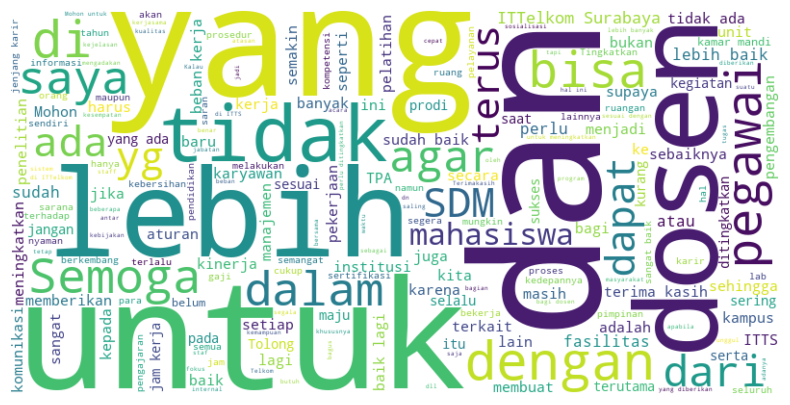

In [4]:
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

# Cleaning

In [5]:
def cleaningText(text):
    text = re.sub(r"@[A-Za-z0-9]+", "", text)  # remove mentions
    text = re.sub(r"#[A-Za-z0-9]+", "", text)  # remove hashtag
    text = re.sub(r"RT[\s]", "", text)  # remove RT
    text = re.sub(r"http\S+", "", text)  # remove link
    text = re.sub(r"[0-9]+", "", text)  # remove numbers

    text = text.replace("\n", " ")  # replace new line into space
    text = text.translate(
        str.maketrans("", "", string.punctuation)
    )  # remove all punctuations
    text = text.strip(" ")  # remove characters space from both left and right text
    return text

def replaceEmojis(text):
    for emoji, meaning in emojis.items():
        text = text.replace(emoji, "EMOJI" + meaning)
    return text

def casefoldingText(text):  # Converting all the characters in a text into lower case
    text = text.lower()
    return text


def tokenizingText(
    text,
):  # Tokenizing or splitting a string, text into a list of tokens
    text = word_tokenize(text)
    return text


# Fungsi untuk memuat stopword dari file CSV
def load_stopwords(csv_filepath):
    df_stopwords = pd.read_csv(csv_filepath)
    return set(df_stopwords['stopword'])  # Nama kolom dari stopword tersebut adalah "ada"

# Mengganti fungsi filteringText untuk menggunakan stopword dari file CSV
def filteringText(text, stopwords_set):
    filtered = [word for word in text if word not in stopwords_set]
    return filtered

# Jalur file ke stopword CSV (sesuaikan dengan lokasi file Anda)
csv_filepath = 'stopwordbahasa.csv'

# Memuat stopword dari file CSV
listStopwords = load_stopwords(csv_filepath)

def stemmingText(
    text,
):  # Reducing a word to its word stem that affixes to suffixes and prefixes or to the roots of words
    factory = StemmerFactory()
    stemmer = factory.create_stemmer()
    text = [stemmer.stem(word) for word in text]
    return text


def toSentence(list_words):  # Convert list of words into sentence
    sentence = " ".join(word for word in list_words)
    return sentence

In [6]:
 # Preprocessing df data
df["text_clean"] = df["komentar"].apply(cleaningText)
df["text_clean"] = df["text_clean"].apply(casefoldingText)
df.drop(["komentar"], axis=1, inplace=True)

df["text_preprocessed"] = df["text_clean"].apply(tokenizingText)
df["text_preprocessed"] = df["text_preprocessed"].apply(lambda x: filteringText(x, listStopwords))
df["text_preprocessed"] = df["text_preprocessed"].apply(stemmingText)

 # drop duplicates/spams data
df.drop_duplicates(subset="text_clean", inplace=True)

df.head()

,Date,Kategori,tipe,text_clean,text_preprocessed
0,2020-07-23,Institusi,dosen,sotk mohon diperjelas agar tidak ada ranah yg ...,"[sotk, mohon, jelas, ranah, yg, tumpang, tindi..."
1,2020-07-23,Institusi,dosen,semoga pelayanannya semakin baik,"[moga, layan]"
2,2020-07-23,Institusi,dosen,semoga makin jaya,"[moga, jaya]"
3,2020-07-23,Institusi,dosen,untuk senantiasa fokus pada tujuan insyaalloh ...,"[senantiasa, fokus, tuju, insyaalloh, raih, aa..."
4,2020-07-23,CapEx,dosen,supaya yang belum pegtap bisa segera pegtap te...,"[pegtap, pegtap, kontribusi, kampus]"


In [7]:
text_len = []
for text in df.text_clean:
    tweet_len = len(text.split())
    text_len.append(tweet_len)

In [8]:
df["text_len"] = text_len


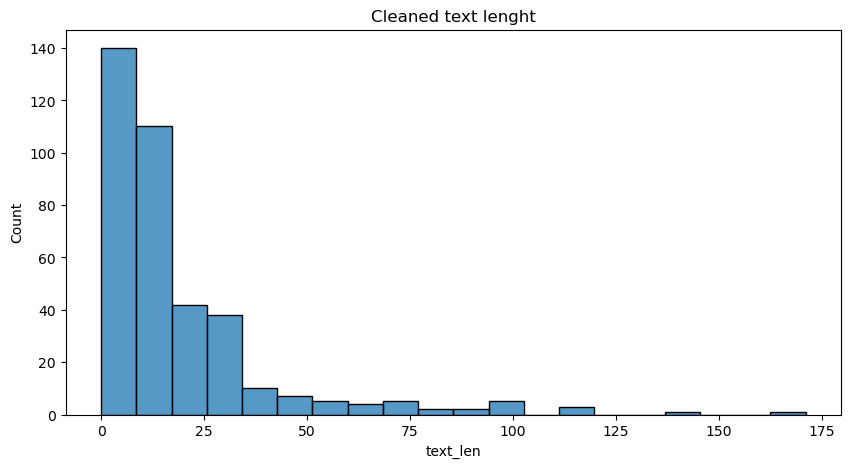

In [9]:
plt.figure(figsize=(10, 5))
sns.histplot(x="text_len", data=df, bins=20)
plt.title("Cleaned text lenght")
plt.show()

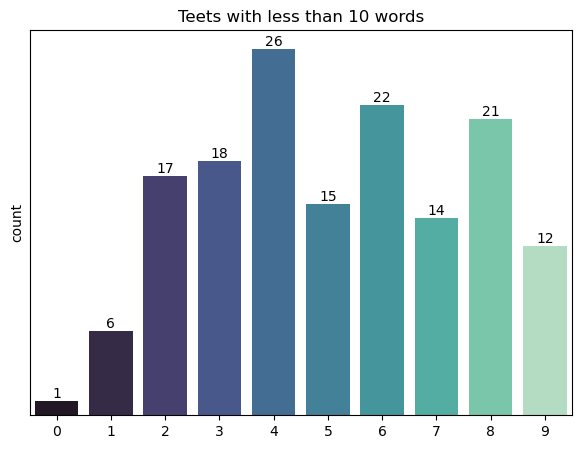

In [10]:
plt.figure(figsize=(7, 5))
ax = sns.countplot(x="text_len", data=df[df["text_len"] < 10], palette="mako")
plt.title("Teets with less than 10 words")
plt.yticks([])
ax.bar_label(ax.containers[0])
plt.ylabel("count")
plt.xlabel("")
plt.show()

## ambil data yang komentarnya memiliki lebih dari 3 kata

In [11]:
df = df[df["text_len"] > 3]
df

,Date,Kategori,tipe,text_clean,text_preprocessed,text_len
0,2020-07-23,Institusi,dosen,sotk mohon diperjelas agar tidak ada ranah yg ...,"[sotk, mohon, jelas, ranah, yg, tumpang, tindi...",20
1,2020-07-23,Institusi,dosen,semoga pelayanannya semakin baik,"[moga, layan]",4
3,2020-07-23,Institusi,dosen,untuk senantiasa fokus pada tujuan insyaalloh ...,"[senantiasa, fokus, tuju, insyaalloh, raih, aa...",10
4,2020-07-23,CapEx,dosen,supaya yang belum pegtap bisa segera pegtap te...,"[pegtap, pegtap, kontribusi, kampus]",15
5,2020-07-23,OpEx,dosen,bagian sdm diharapkan mulai memperhatikan load...,"[sdm, harap, perhati, load, kerja, masingmasin...",22
...,...,...,...,...,...,...
383,2023-03-16,CapEx,dosen,pengelolaan sdm perlu dikembngkn lgi termasuk ...,"[kelola, sdm, dikembngkn, lgi, yg, kait, dgn, ...",13
384,2023-03-16,Institusi,dosen,terus ditingkatkan gitu aja lur,"[tingkat, gitu, aja, lur]",5
385,2023-03-16,Institusi,dosen,terima kasih sudah bagus tapi komunikasi untuk...,"[terima, kasih, bagus, komunikasi, capai, visi...",32
386,2023-03-16,OpEx,dosen,perlu samakan persepsi melalui komunikasi yang...,"[sama, persepsi, komunikasi, unit, dosen, kerj...",21


In [12]:
all_textt = " ".join(" ".join(tweet) for tweet in df["text_preprocessed"])
wordcloud = WordCloud(background_color="white", width=800, height=400).generate(all_textt)


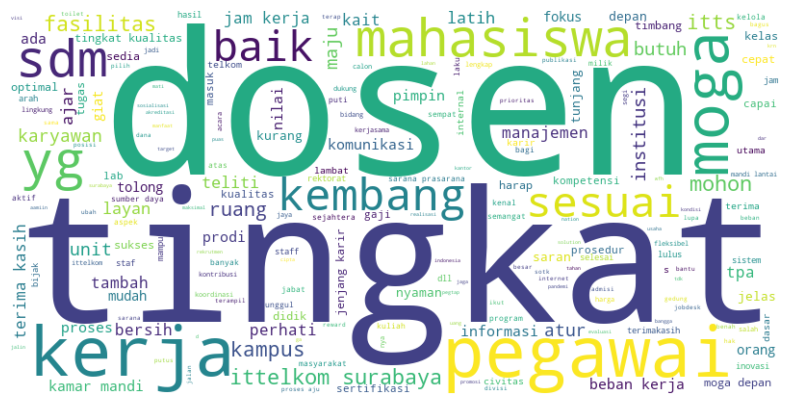

In [13]:
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

# analysis

In [14]:
df20 = df[:64]
df21 = df[64:180]
df22 = df[180:211]
df23 = df[211:]

In [15]:
dfc = df[df['Kategori']=='CapEx']
dfo = df[df['Kategori']=='OpEx']
dfi = df[df['Kategori']=='Institusi']

In [16]:
dfd = df[df['tipe']=='dosen']
dfdc = dfd[dfd['Kategori']=='CapEx']
dfdo = dfd[dfd['Kategori']=='OpEx']
dfdi = dfd[dfd['Kategori']=='Institusi']

dft = df[df['tipe']=='dosen']
dftc = dft[dft['Kategori']=='CapEx']
dfto = dft[dft['Kategori']=='OpEx']
dfti = dft[dft['Kategori']=='Institusi']

In [17]:
df20c = df20[df20['Kategori']=='CapEx']
df20o = df20[df20['Kategori']=='OpEx']
df20i = df20[df20['Kategori']=='Institusi']

df21c = df21[df21['Kategori']=='CapEx']
df21o = df21[df21['Kategori']=='OpEx']
df21i = df21[df21['Kategori']=='Institusi']

df22c = df22[df22['Kategori']=='CapEx']
df22o = df22[df22['Kategori']=='OpEx']
df22i = df22[df22['Kategori']=='Institusi']

df23c = df23[df23['Kategori']=='CapEx']
df23o = df23[df23['Kategori']=='OpEx']
df23i = df23[df23['Kategori']=='Institusi']

## plot perbandingan jumlah kategori

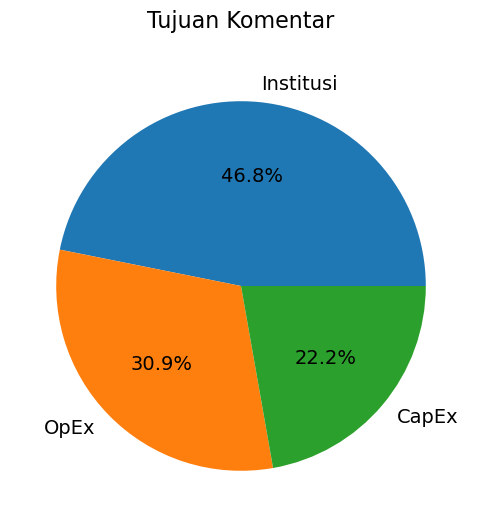

In [18]:
fig, ax = plt.subplots(figsize=(6, 6))
sizes = [count for count in df["Kategori"].value_counts()]
labels = list(df["Kategori"].value_counts().index)
explode = (0.1, 0, 0)
ax.pie(
    x=sizes,
    labels=labels,
    autopct="%1.1f%%",
    textprops={"fontsize": 14},
)
ax.set_title("Tujuan Komentar", fontsize=16, pad=20)
plt.show()

## Perbandingan jumlah respon

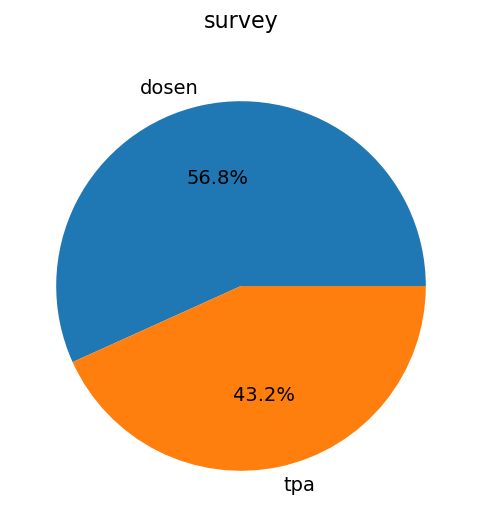

In [19]:
fig, ax = plt.subplots(figsize=(6, 6))
sizes = [count for count in df["tipe"].value_counts()]
labels = list(df["tipe"].value_counts().index)
explode = (0.1, 0, 0)
ax.pie(
    x=sizes,
    labels=labels,
    autopct="%1.1f%%",
    textprops={"fontsize": 14},
)
ax.set_title("survey", fontsize=16, pad=20)
plt.show()

## perbandingan jumlah respon tiap tahun

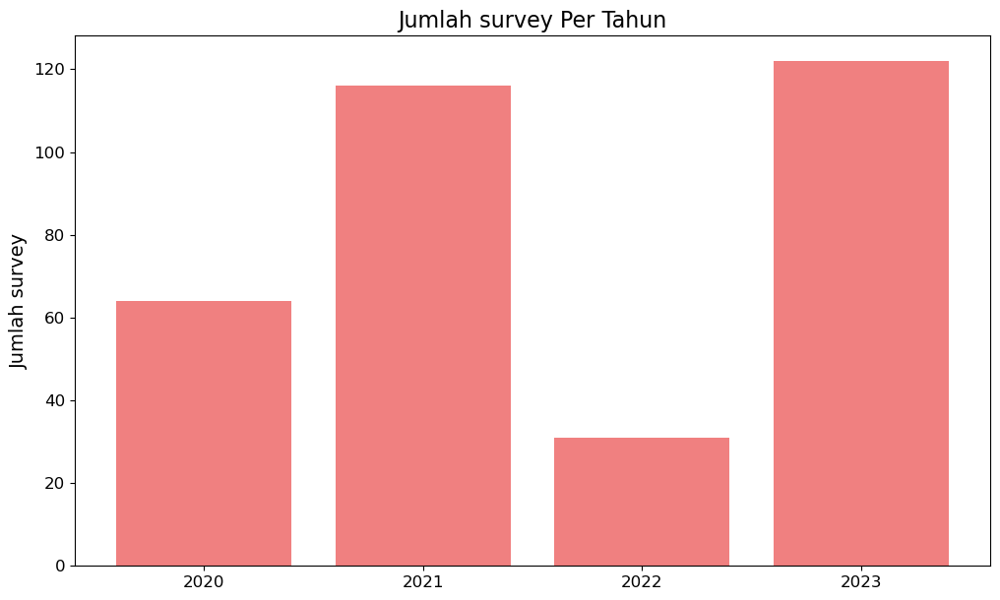

In [20]:
plt.figure(figsize=(12,7))
tahun =['2020','2021','2022','2023']
jumlah = [len(df20),len(df21),len(df22),len(df23)]
plt.bar(tahun, jumlah, color='lightcoral')

plt.title('Jumlah survey Per Tahun', size=16)
plt.ylabel('Jumlah survey', size=14)
plt.xticks(size=12)
plt.yticks(size=12)

plt.show()

# WordCloud

In [21]:
df.reset_index(inplace=True)

In [22]:
df=df.drop('index',axis=1)
df

,Date,Kategori,tipe,text_clean,text_preprocessed,text_len
0,2020-07-23,Institusi,dosen,sotk mohon diperjelas agar tidak ada ranah yg ...,"[sotk, mohon, jelas, ranah, yg, tumpang, tindi...",20
1,2020-07-23,Institusi,dosen,semoga pelayanannya semakin baik,"[moga, layan]",4
2,2020-07-23,Institusi,dosen,untuk senantiasa fokus pada tujuan insyaalloh ...,"[senantiasa, fokus, tuju, insyaalloh, raih, aa...",10
3,2020-07-23,CapEx,dosen,supaya yang belum pegtap bisa segera pegtap te...,"[pegtap, pegtap, kontribusi, kampus]",15
4,2020-07-23,OpEx,dosen,bagian sdm diharapkan mulai memperhatikan load...,"[sdm, harap, perhati, load, kerja, masingmasin...",22
...,...,...,...,...,...,...
328,2023-03-16,CapEx,dosen,pengelolaan sdm perlu dikembngkn lgi termasuk ...,"[kelola, sdm, dikembngkn, lgi, yg, kait, dgn, ...",13
329,2023-03-16,Institusi,dosen,terus ditingkatkan gitu aja lur,"[tingkat, gitu, aja, lur]",5
330,2023-03-16,Institusi,dosen,terima kasih sudah bagus tapi komunikasi untuk...,"[terima, kasih, bagus, komunikasi, capai, visi...",32
331,2023-03-16,OpEx,dosen,perlu samakan persepsi melalui komunikasi yang...,"[sama, persepsi, komunikasi, unit, dosen, kerj...",21


In [23]:
def get_sentences_with_word(data, target_word):
    sentences = data[data['text_clean'].str.contains(target_word, case=False)]['text_clean']
    return sentences

## Keseluruhan

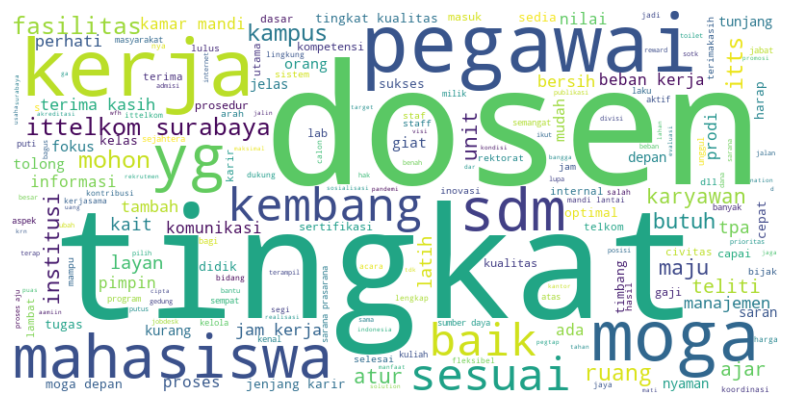

In [24]:
all_textdf = ' '.join([' '.join(text) for text in df['text_preprocessed']])

# Buat WordCloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_textdf)

# Plot WordCloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [25]:
target_word = 'dosen'
sentences_with_word = get_sentences_with_word(df, target_word)
print(f"Sentences containing '{target_word}':")
print(f"jumlah komentar: {len(sentences_with_word)}")
for sentence in sentences_with_word:
    print(sentence)
    print(" ")

Sentences containing 'dosen':
jumlah komentar: 63
dosen diberi kelenturan dalam jam kerja jika keluar dari pandemi saya mengusulkan dalam  minggu ada kesempatan untuk wfh setidaknya  hari selebihnya wfo dimana wfo dapat lebih banyak dari pada wfh
 
pengelolaan lab diharapkan study banding dengan lablab di universitasinstitusi lain tidak serta merta krn ntf semuanya disewakan institusi seharusnya memberikan sarana prasarana bagi dosenmahasiswa yg melakukan penelitian  pkm tanpa memungut biaya lagi bisa dikaji ulang terkait ntf dari persewaan alatkomputer sy rasa di kampus lain tidak ada kecuali klo meminjamkan lab kepada pihak luar yg ingin mengadakan kegiatan menggunakan fasilitas kampus kalo yg ini bs jadi ntf
 
fasilitas khususnya untuk dosen harus lbih diperhatikan dan diutamakan karena dosen adalah alat untuk membuat produk atau keluaran mahasiswa kita menjadi yang terbaik kalau terkesan apa yang ada maka produknya juga keluar apa yang ada
 
dapat lebih mengatur manajemen kerja sta

## Capex

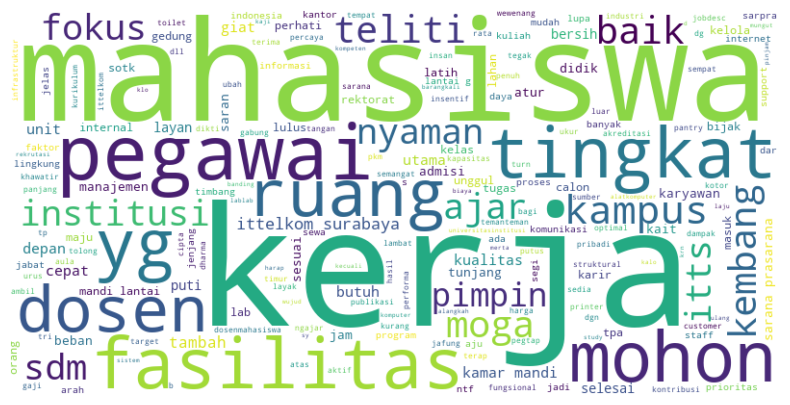

In [26]:
all_textdfc = ' '.join([' '.join(text) for text in dfc['text_preprocessed']])

# Buat WordCloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_textdfc)

# Plot WordCloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [27]:
target_word = 'kerja'
sentences_with_word = get_sentences_with_word(dfc, target_word)
print(f"Sentences containing '{target_word}':")
print(f"jumlah komentar: {len(sentences_with_word)}")
for sentence in sentences_with_word:
    print(sentence)
    print(" ")

Sentences containing 'kerja':
jumlah komentar: 18
adanya fasilitas komputer setiap staff sehingga memudahkan pekerjaan saat di kantor
 
meningkatkan kebersihan di kantor dengan cara membagi tanggung jawab hk di setiap ruangan kantor untuk diminta standby selama jam kerja apabila ada suatu hal terjadi seperti kamar mandi kotor atau mampet air galon habis gelas kotor menumpuk tidak dibiarkan terlalu lama
 
semoga sarana dan prasarana semakin menunjang kegiatan bekerja dan menjadikan staff optimal dalam bekerja terutama dari segi gaji terakhir semoga ittelkom surabaya menjadi kampus yang unggul di bidang it khususnya di indonesia bagian timur entah dari staff pengajar mahasiswa bahkan lulusan
 
tempat kerja agar lebih bersih dan nyaman terutama pada toilet nya
 
suatu hal yang baik kita fokus dalam penerimaan mahasiswa baru dan baik juga fokus pada pencarian mitra untuk penempatan lulusan atau calon lulusan namun hendaknya yang tidak boleh kita lupakan dan harusnya lebih kita fokuskan ada

## Opex

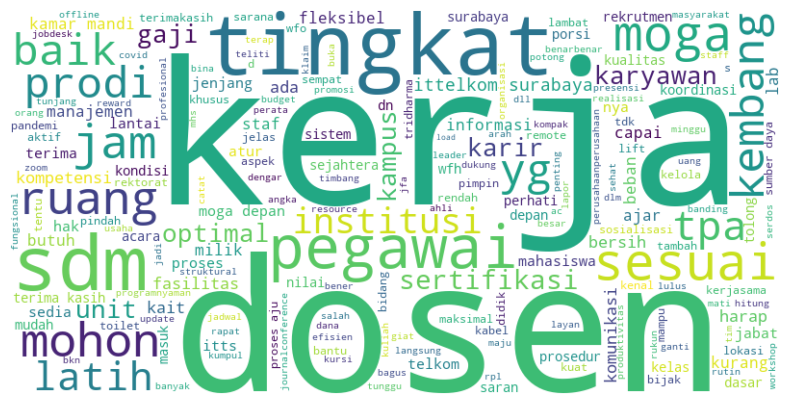

In [28]:
all_textdfo = ' '.join([' '.join(text) for text in dfo['text_preprocessed']])

# Buat WordCloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_textdfo)

# Plot WordCloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [29]:
target_word = 'dosen'
sentences_with_word = get_sentences_with_word(dfo, target_word)
print(f"Sentences containing '{target_word}':")
print(f"jumlah komentar: {len(sentences_with_word)}")
for sentence in sentences_with_word:
    print(sentence)
    print(" ")

Sentences containing 'dosen':
jumlah komentar: 30
dosen diberi kelenturan dalam jam kerja jika keluar dari pandemi saya mengusulkan dalam  minggu ada kesempatan untuk wfh setidaknya  hari selebihnya wfo dimana wfo dapat lebih banyak dari pada wfh
 
dapat lebih mengatur manajemen kerja staff dan dosennya agar sesuai akad jam kerja serta jabatan lainnya sudah cukup baik
 
fasilitas yang belum terealisasi segera direalisasi kebersihan setiap ruang dosen mohon dibersihkan setiap hari nya penjelasan terkait hibah ristekbrin mohon disosialisasikan dengan benar jangan asal lewat saja
 
fasilitas untuk dosen di saat wfh
 
hak tpa dalam mendapatkan softskill untuk meningkatan kompetensi dan kemampuan dirinya untuk kepentingan ittelkom surabaya tidak dikelola baik oleh sdm pengelolaan karir sdm lebih cenderung ke dosen baiknya hak yang dimiliki tpa juga ikut dipenuhisetidaknya effortnya ada
 
kekurangan sdm prodi karena diperbantukan di institusi ada beberapa pegawai tertentu yang beban kerja ja

## Institusi

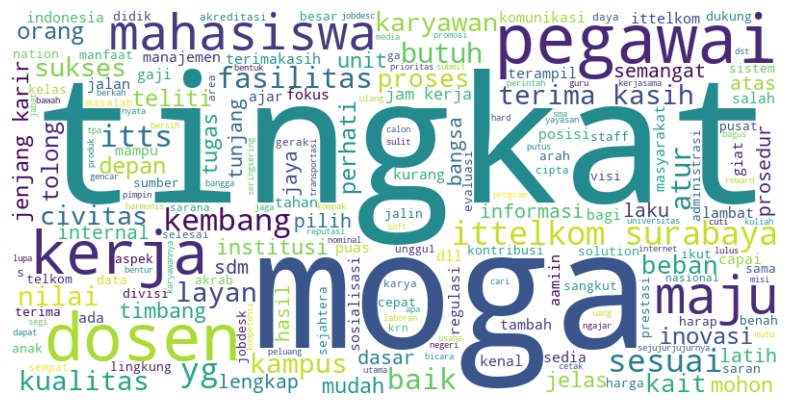

In [30]:
all_textdfi = ' '.join([' '.join(text) for text in dfi['text_preprocessed']])

# Buat WordCloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_textdfi)

# Plot WordCloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [31]:
target_word = 'tingkat'
sentences_with_word = get_sentences_with_word(dfi, target_word)
print(f"Sentences containing '{target_word}':")
print(f"jumlah komentar: {len(sentences_with_word)}")
for sentence in sentences_with_word:
    print(sentence)
    print(" ")

Sentences containing 'tingkat':
jumlah komentar: 17
tingkatkan terus pengembangan dan sukses selalu
 
tidak ada sudah baik semuanya dipertahankan dan ditingkatkan
 
terus berbenah dan terus tingkatkan layanan
 
tingkatkan kerjasama antar civitas
 
tingkatkan dan kejar terus kemajuan dan kejayaan ittelkom surabaya
 
semoga untuk ke depannya ittelkom surabaya dapat ditingkatkan segala kualitasnya dan menjadi instansi yang dapat dikenal lebih banyak orang
 
terus maju bergerak untuk memajukan anak anak bangsa tingkatkan kwalitas dosen terus menerussukses itts
 
pertahankan prestasi yang telah dicapai dan terus tingkatkan prestasiprestasi yang belum tercapai
 
lebih ditingkatkan dan ditegaskan kembali terkait aturanaturan yang ada di itts
 
peningkatan integrasi kegiatan dan segala aspek universitas rektorat dekanat prodi mahasiswa dll  pemilihan aktor sesuai dengan keahlian dibidangnya  peningkatan personal branding dan sense of belonging  prioritas dalam fasilitas dan penelitian atau kei

## Respon Dosen

### Keseluruhan

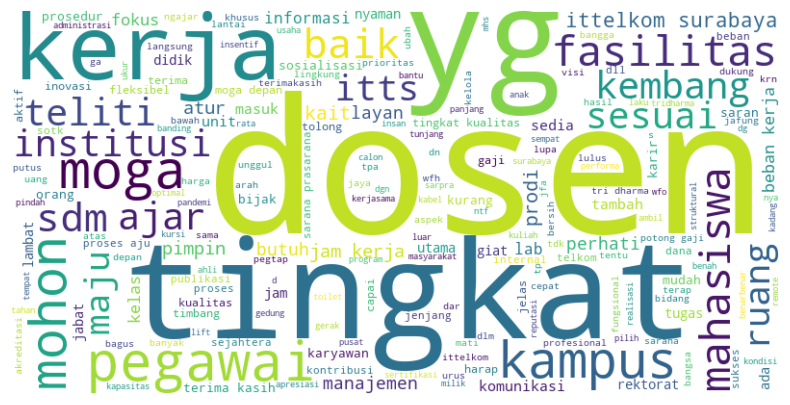

In [32]:
all_textdfd = ' '.join([' '.join(text) for text in dfd['text_preprocessed']])

# Buat WordCloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_textdfd)

# Plot WordCloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [33]:
target_word = 'dosen'
sentences_with_word = get_sentences_with_word(dfd, target_word)
print(f"Sentences containing '{target_word}':")
print(f"jumlah komentar: {len(sentences_with_word)}")
for sentence in sentences_with_word:
    print(sentence)
    print(" ")

Sentences containing 'dosen':
jumlah komentar: 55
dosen diberi kelenturan dalam jam kerja jika keluar dari pandemi saya mengusulkan dalam  minggu ada kesempatan untuk wfh setidaknya  hari selebihnya wfo dimana wfo dapat lebih banyak dari pada wfh
 
pengelolaan lab diharapkan study banding dengan lablab di universitasinstitusi lain tidak serta merta krn ntf semuanya disewakan institusi seharusnya memberikan sarana prasarana bagi dosenmahasiswa yg melakukan penelitian  pkm tanpa memungut biaya lagi bisa dikaji ulang terkait ntf dari persewaan alatkomputer sy rasa di kampus lain tidak ada kecuali klo meminjamkan lab kepada pihak luar yg ingin mengadakan kegiatan menggunakan fasilitas kampus kalo yg ini bs jadi ntf
 
fasilitas khususnya untuk dosen harus lbih diperhatikan dan diutamakan karena dosen adalah alat untuk membuat produk atau keluaran mahasiswa kita menjadi yang terbaik kalau terkesan apa yang ada maka produknya juga keluar apa yang ada
 
dapat lebih mengatur manajemen kerja sta

### Capex

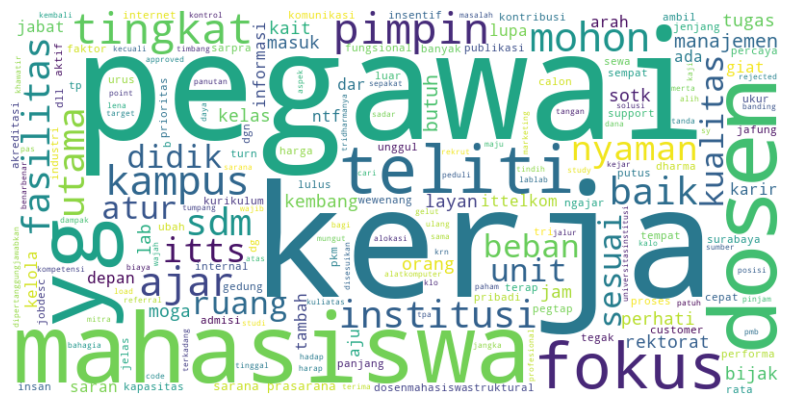

In [34]:
all_textdfdc = ' '.join([' '.join(text) for text in dfdc['text_preprocessed']])

# Buat WordCloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_textdfdc)

# Plot WordCloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [35]:
target_word = 'pegawai'
sentences_with_word = get_sentences_with_word(dfdc, target_word)
print(f"Sentences containing '{target_word}':")
print(f"jumlah komentar: {len(sentences_with_word)}")
for sentence in sentences_with_word:
    print(sentence)
    print(" ")

Sentences containing 'pegawai':
jumlah komentar: 8
aktifkan itts point  referral code pmb supaya setiap pegawai sadar  aktif dalam memajukan kampus ini
 
penempatan pegawai untuk posisi jabatan struktural dipertimbangkan dengan baik dan disesuaikan dengan kapasitas pegawai sehingga sotk tidak terlalu cepat berubah
 
atasan lebih peduli lagi dengan unit yang dipimpinnya memahami permasalahan yang dihadapi memberikan saran solusi dan kebijakan  pembagian fokus sumber daya untuk admisi dan manajemen internal untuk meningkatkan kapasitas institusi aspek manajemen internal juga sudah harus menjadi perhatian seperti pengembangan dosen penelitian dosen pkm kualitas pembelajaran kurikulum layanan kemahasiswaan sarpra dll untuk mengejar target akreditasi unggul  dosen dikembalikan sesuai dengan fungsionalnya sehingga dapat berkontribusi dalam tugas tridharmanya beberapa jabatan struktural dapat dialihkan ke profesional atau tpa  manajemen sdm perlu ditingkatkan perekrutan pegawai disesuikan den

### Opex

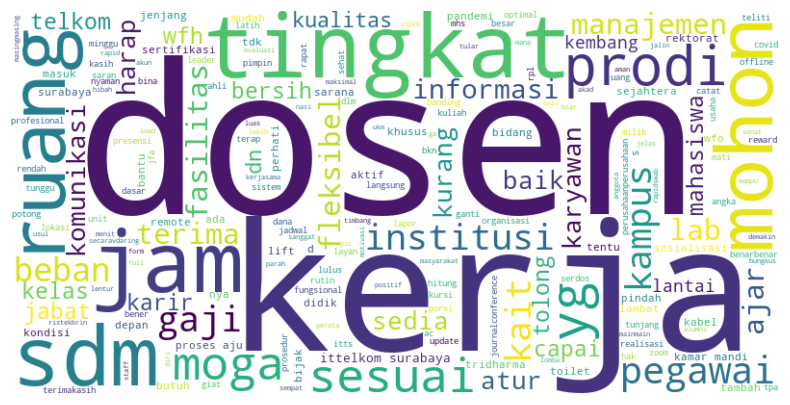

In [36]:
all_textdfdo = ' '.join([' '.join(text) for text in dfdo['text_preprocessed']])

# Buat WordCloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_textdfdo)

# Plot WordCloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [37]:
target_word = 'dosen'
sentences_with_word = get_sentences_with_word(dfdo, target_word)
print(f"Sentences containing '{target_word}':")
print(f"jumlah komentar: {len(sentences_with_word)}")
for sentence in sentences_with_word:
    print(sentence)
    print(" ")

Sentences containing 'dosen':
jumlah komentar: 26
dosen diberi kelenturan dalam jam kerja jika keluar dari pandemi saya mengusulkan dalam  minggu ada kesempatan untuk wfh setidaknya  hari selebihnya wfo dimana wfo dapat lebih banyak dari pada wfh
 
dapat lebih mengatur manajemen kerja staff dan dosennya agar sesuai akad jam kerja serta jabatan lainnya sudah cukup baik
 
fasilitas yang belum terealisasi segera direalisasi kebersihan setiap ruang dosen mohon dibersihkan setiap hari nya penjelasan terkait hibah ristekbrin mohon disosialisasikan dengan benar jangan asal lewat saja
 
fasilitas untuk dosen di saat wfh
 
kekurangan sdm prodi karena diperbantukan di institusi ada beberapa pegawai tertentu yang beban kerja jauh lebih rendah dibanding saya banyak sekali beban kerja yang tidak bisa saya catatkan ke dalam form beban kerja seperti pic pendirian prodi baru pembina ukm dan keanggotaan senat tidaklah pantas seorang dosen dengan jenjang pendidikan tinggi dan keahlian khusus diberikan n

### Institusi

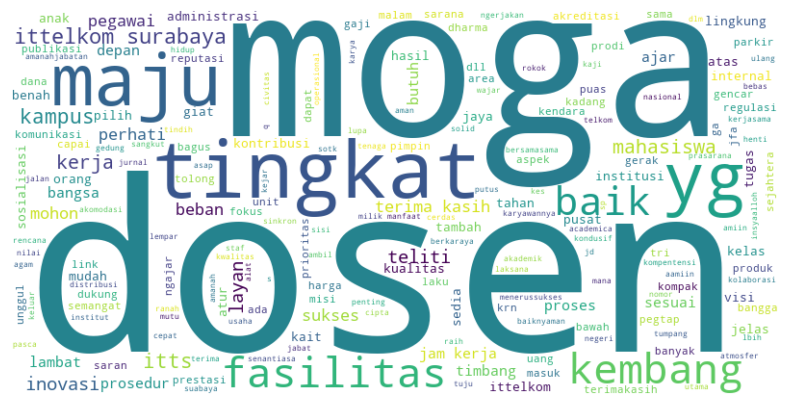

In [38]:
all_textdfdi = ' '.join([' '.join(text) for text in dfdi['text_preprocessed']])

# Buat WordCloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_textdfdi)

# Plot WordCloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [39]:
target_word = 'dosen'
sentences_with_word = get_sentences_with_word(dfdi, target_word)
print(f"Sentences containing '{target_word}':")
print(f"jumlah komentar: {len(sentences_with_word)}")
for sentence in sentences_with_word:
    print(sentence)
    print(" ")

Sentences containing 'dosen':
jumlah komentar: 19
fasilitas khususnya untuk dosen harus lbih diperhatikan dan diutamakan karena dosen adalah alat untuk membuat produk atau keluaran mahasiswa kita menjadi yang terbaik kalau terkesan apa yang ada maka produknya juga keluar apa yang ada
 
penyamaan visi dan misi kepada seluruh civitas academica khususnya dosen dan staf
 
akreditasi a kerjasama luar negeri dosen s berprestasi jurnal q bereputasi gedung fasilitas sangat mendukung keuangan baik
 
terus maju bergerak untuk memajukan anak anak bangsa tingkatkan kwalitas dosen terus menerussukses itts
 
sejauh ini saya sangat puas bekerja di ittelkom surabaya baik dari fasilitas yang didapatkan maupun gaji yang diberikan saran menambah jumlah tenaga dosen karena sudah semakin banyak mahasiswanya
 
mengurangi dosen dan staff wanita
 
dosen bukan sebagai pelayan administrasi yang harus datang pagi tidak seperti teller atau petugas administrasi dmn jk terlambat akan terhambat dg yang lain dosen te

## Respon TPA

### Keseluruhan

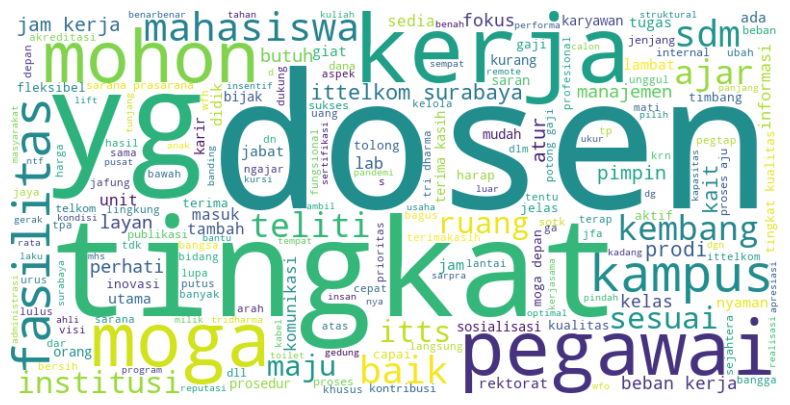

In [40]:
all_textdft = ' '.join([' '.join(text) for text in dft['text_preprocessed']])

# Buat WordCloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_textdft)

# Plot WordCloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [41]:
target_word = 'dosen'
sentences_with_word = get_sentences_with_word(dft, target_word)
print(f"Sentences containing '{target_word}':")
print(f"jumlah komentar: {len(sentences_with_word)}")
for sentence in sentences_with_word:
    print(sentence)
    print(" ")

Sentences containing 'dosen':
jumlah komentar: 55
dosen diberi kelenturan dalam jam kerja jika keluar dari pandemi saya mengusulkan dalam  minggu ada kesempatan untuk wfh setidaknya  hari selebihnya wfo dimana wfo dapat lebih banyak dari pada wfh
 
pengelolaan lab diharapkan study banding dengan lablab di universitasinstitusi lain tidak serta merta krn ntf semuanya disewakan institusi seharusnya memberikan sarana prasarana bagi dosenmahasiswa yg melakukan penelitian  pkm tanpa memungut biaya lagi bisa dikaji ulang terkait ntf dari persewaan alatkomputer sy rasa di kampus lain tidak ada kecuali klo meminjamkan lab kepada pihak luar yg ingin mengadakan kegiatan menggunakan fasilitas kampus kalo yg ini bs jadi ntf
 
fasilitas khususnya untuk dosen harus lbih diperhatikan dan diutamakan karena dosen adalah alat untuk membuat produk atau keluaran mahasiswa kita menjadi yang terbaik kalau terkesan apa yang ada maka produknya juga keluar apa yang ada
 
dapat lebih mengatur manajemen kerja sta

### Capex

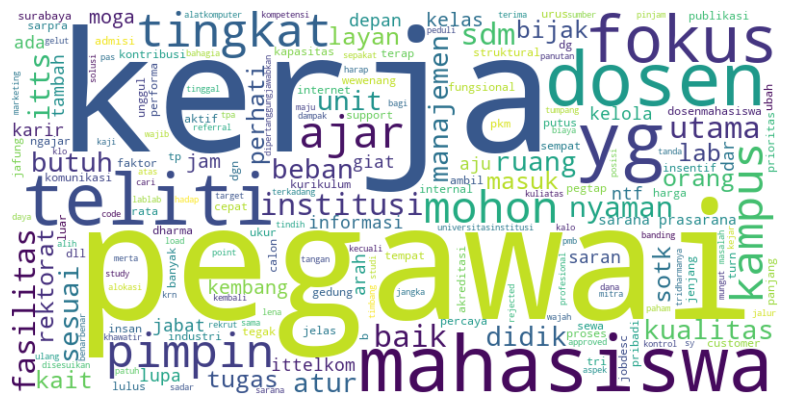

In [42]:
all_textdftc = ' '.join([' '.join(text) for text in dftc['text_preprocessed']])

# Buat WordCloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_textdftc)

# Plot WordCloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [43]:
target_word = 'dosen'
sentences_with_word = get_sentences_with_word(dftc, target_word)
print(f"Sentences containing '{target_word}':")
print(f"jumlah komentar: {len(sentences_with_word)}")
for sentence in sentences_with_word:
    print(sentence)
    print(" ")

Sentences containing 'dosen':
jumlah komentar: 10
pengelolaan lab diharapkan study banding dengan lablab di universitasinstitusi lain tidak serta merta krn ntf semuanya disewakan institusi seharusnya memberikan sarana prasarana bagi dosenmahasiswa yg melakukan penelitian  pkm tanpa memungut biaya lagi bisa dikaji ulang terkait ntf dari persewaan alatkomputer sy rasa di kampus lain tidak ada kecuali klo meminjamkan lab kepada pihak luar yg ingin mengadakan kegiatan menggunakan fasilitas kampus kalo yg ini bs jadi ntf
 
perbaikan ruang dosen alokasi dana untuk publikasi dan penelitian
 
banyak pekerjaan diluar beban kinerja dosen yang sudah di sepakati perlu diatur lebih lanjut untuk meningkatkan faktor kebahagiaan dalam bekerja
 
atasan lebih peduli lagi dengan unit yang dipimpinnya memahami permasalahan yang dihadapi memberikan saran solusi dan kebijakan  pembagian fokus sumber daya untuk admisi dan manajemen internal untuk meningkatkan kapasitas institusi aspek manajemen internal juga

### Opex

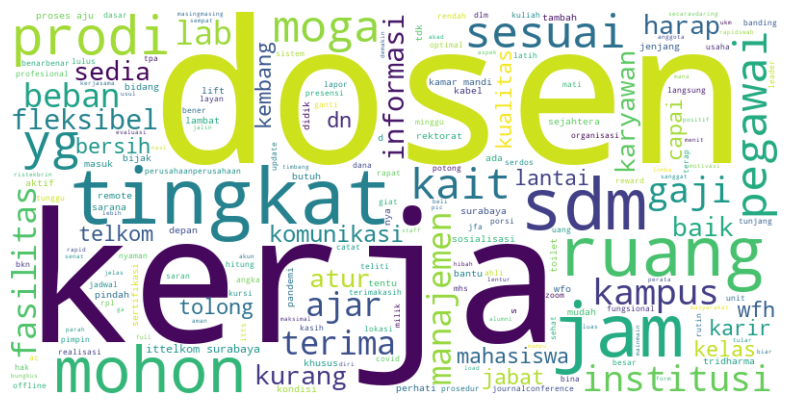

In [44]:
all_textdfto = ' '.join([' '.join(text) for text in dfto['text_preprocessed']])

# Buat WordCloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_textdfto)

# Plot WordCloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [45]:
target_word = 'dosen'
sentences_with_word = get_sentences_with_word(dfto, target_word)
print(f"Sentences containing '{target_word}':")
print(f"jumlah komentar: {len(sentences_with_word)}")
for sentence in sentences_with_word:
    print(sentence)
    print(" ")

Sentences containing 'dosen':
jumlah komentar: 26
dosen diberi kelenturan dalam jam kerja jika keluar dari pandemi saya mengusulkan dalam  minggu ada kesempatan untuk wfh setidaknya  hari selebihnya wfo dimana wfo dapat lebih banyak dari pada wfh
 
dapat lebih mengatur manajemen kerja staff dan dosennya agar sesuai akad jam kerja serta jabatan lainnya sudah cukup baik
 
fasilitas yang belum terealisasi segera direalisasi kebersihan setiap ruang dosen mohon dibersihkan setiap hari nya penjelasan terkait hibah ristekbrin mohon disosialisasikan dengan benar jangan asal lewat saja
 
fasilitas untuk dosen di saat wfh
 
kekurangan sdm prodi karena diperbantukan di institusi ada beberapa pegawai tertentu yang beban kerja jauh lebih rendah dibanding saya banyak sekali beban kerja yang tidak bisa saya catatkan ke dalam form beban kerja seperti pic pendirian prodi baru pembina ukm dan keanggotaan senat tidaklah pantas seorang dosen dengan jenjang pendidikan tinggi dan keahlian khusus diberikan n

### Institusi

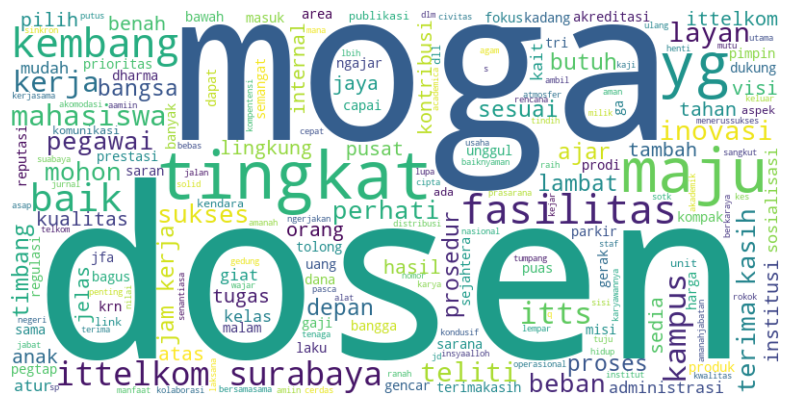

In [46]:
all_textdfti = ' '.join([' '.join(text) for text in dfti['text_preprocessed']])

# Buat WordCloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_textdfti)

# Plot WordCloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [47]:
target_word = 'dosen'
sentences_with_word = get_sentences_with_word(dfti, target_word)
print(f"Sentences containing '{target_word}':")
print(f"jumlah komentar: {len(sentences_with_word)}")
for sentence in sentences_with_word:
    print(sentence)
    print(" ")

Sentences containing 'dosen':
jumlah komentar: 19
fasilitas khususnya untuk dosen harus lbih diperhatikan dan diutamakan karena dosen adalah alat untuk membuat produk atau keluaran mahasiswa kita menjadi yang terbaik kalau terkesan apa yang ada maka produknya juga keluar apa yang ada
 
penyamaan visi dan misi kepada seluruh civitas academica khususnya dosen dan staf
 
akreditasi a kerjasama luar negeri dosen s berprestasi jurnal q bereputasi gedung fasilitas sangat mendukung keuangan baik
 
terus maju bergerak untuk memajukan anak anak bangsa tingkatkan kwalitas dosen terus menerussukses itts
 
sejauh ini saya sangat puas bekerja di ittelkom surabaya baik dari fasilitas yang didapatkan maupun gaji yang diberikan saran menambah jumlah tenaga dosen karena sudah semakin banyak mahasiswanya
 
mengurangi dosen dan staff wanita
 
dosen bukan sebagai pelayan administrasi yang harus datang pagi tidak seperti teller atau petugas administrasi dmn jk terlambat akan terhambat dg yang lain dosen te

## 2020

### keseluruhan 

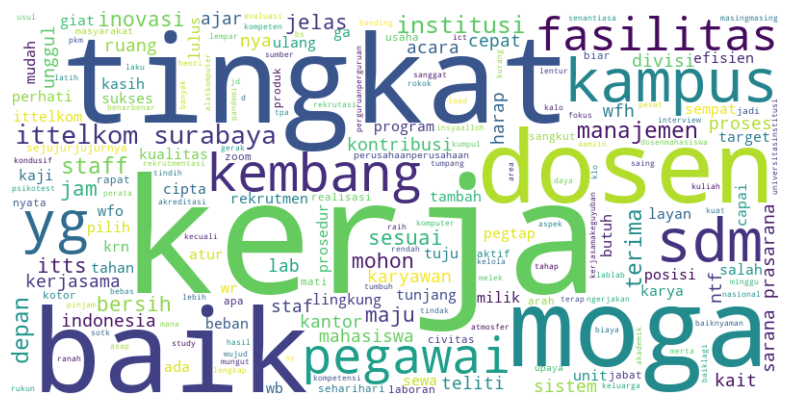

In [48]:
all_textdf20 = ' '.join([' '.join(text) for text in df20['text_preprocessed']])

# Buat WordCloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_textdf20)

# Plot WordCloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [49]:
target_word = 'dosen'
sentences_with_word = get_sentences_with_word(df20, target_word)
print(f"Sentences containing '{target_word}':")
print(f"jumlah komentar: {len(sentences_with_word)}")
for sentence in sentences_with_word:
    print(sentence)
    print(" ")

Sentences containing 'dosen':
jumlah komentar: 9
dosen diberi kelenturan dalam jam kerja jika keluar dari pandemi saya mengusulkan dalam  minggu ada kesempatan untuk wfh setidaknya  hari selebihnya wfo dimana wfo dapat lebih banyak dari pada wfh
 
pengelolaan lab diharapkan study banding dengan lablab di universitasinstitusi lain tidak serta merta krn ntf semuanya disewakan institusi seharusnya memberikan sarana prasarana bagi dosenmahasiswa yg melakukan penelitian  pkm tanpa memungut biaya lagi bisa dikaji ulang terkait ntf dari persewaan alatkomputer sy rasa di kampus lain tidak ada kecuali klo meminjamkan lab kepada pihak luar yg ingin mengadakan kegiatan menggunakan fasilitas kampus kalo yg ini bs jadi ntf
 
fasilitas khususnya untuk dosen harus lbih diperhatikan dan diutamakan karena dosen adalah alat untuk membuat produk atau keluaran mahasiswa kita menjadi yang terbaik kalau terkesan apa yang ada maka produknya juga keluar apa yang ada
 
dapat lebih mengatur manajemen kerja staf

### Capex

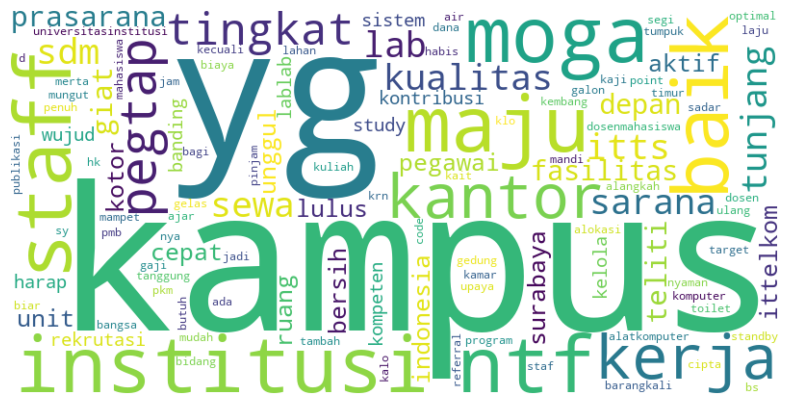

In [50]:
all_textdf20c = ' '.join([' '.join(text) for text in df20c['text_preprocessed']])

# Buat WordCloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_textdf20c)

# Plot WordCloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [51]:
target_word = 'kampus'
sentences_with_word = get_sentences_with_word(df20c, target_word)
print(f"Sentences containing '{target_word}':")
print(f"jumlah komentar: {len(sentences_with_word)}")
for sentence in sentences_with_word:
    print(sentence)
    print(" ")

Sentences containing 'kampus':
jumlah komentar: 4
supaya yang belum pegtap bisa segera pegtap terutama yang sudah berkontribusi sangat besar bagi kampus
 
pengelolaan lab diharapkan study banding dengan lablab di universitasinstitusi lain tidak serta merta krn ntf semuanya disewakan institusi seharusnya memberikan sarana prasarana bagi dosenmahasiswa yg melakukan penelitian  pkm tanpa memungut biaya lagi bisa dikaji ulang terkait ntf dari persewaan alatkomputer sy rasa di kampus lain tidak ada kecuali klo meminjamkan lab kepada pihak luar yg ingin mengadakan kegiatan menggunakan fasilitas kampus kalo yg ini bs jadi ntf
 
aktifkan itts point  referral code pmb supaya setiap pegawai sadar  aktif dalam memajukan kampus ini
 
semoga sarana dan prasarana semakin menunjang kegiatan bekerja dan menjadikan staff optimal dalam bekerja terutama dari segi gaji terakhir semoga ittelkom surabaya menjadi kampus yang unggul di bidang it khususnya di indonesia bagian timur entah dari staff pengajar ma

### Opex

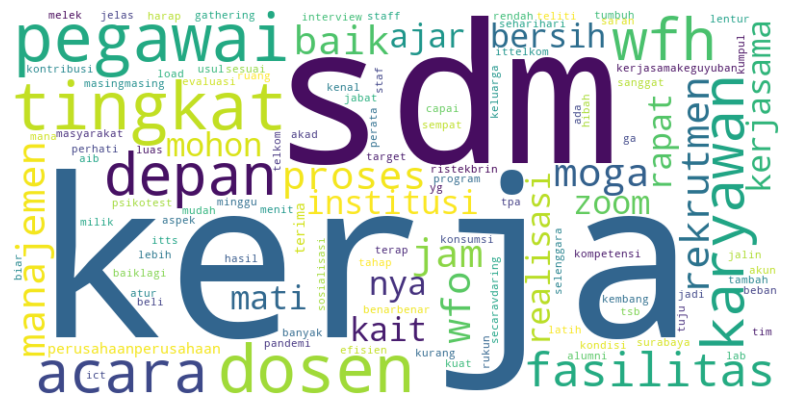

In [52]:
all_textdf20o = ' '.join([' '.join(text) for text in df20o['text_preprocessed']])

# Buat WordCloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_textdf20o)

# Plot WordCloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [53]:
target_word = 'kerja'
sentences_with_word = get_sentences_with_word(df20o, target_word)
print(f"Sentences containing '{target_word}':")
print(f"jumlah komentar: {len(sentences_with_word)}")
for sentence in sentences_with_word:
    print(sentence)
    print(" ")

Sentences containing 'kerja':
jumlah komentar: 7
bagian sdm diharapkan mulai memperhatikan load kerja masingmasing karyawan ada yang sangat tinggi dan ada yang sanggat rendah sehingga kurangnya pemerataan beban
 
lebih meningkatkan kerjasamakeguyuban dan kerukunan pegawai
 
dosen diberi kelenturan dalam jam kerja jika keluar dari pandemi saya mengusulkan dalam  minggu ada kesempatan untuk wfh setidaknya  hari selebihnya wfo dimana wfo dapat lebih banyak dari pada wfh
 
apabila kondisi sudah membaik dapat diselenggarakan suatu acara seperti gathering untuk semua pegawai acara tsb bertujuan untuk meningkatkan kerjasama dan dapat mengenal lebih dalam antara satu dan lainnya
 
dapat lebih mengatur manajemen kerja staff dan dosennya agar sesuai akad jam kerja serta jabatan lainnya sudah cukup baik
 
lebih banyak menjalin kerjasama dengan institusi lain terutama dengan perusahaanperusahaan lain selain telkom agar ke depan alumni bisa diterima masyarakat luas dan dapat diterima kerja di perus

### Institusi

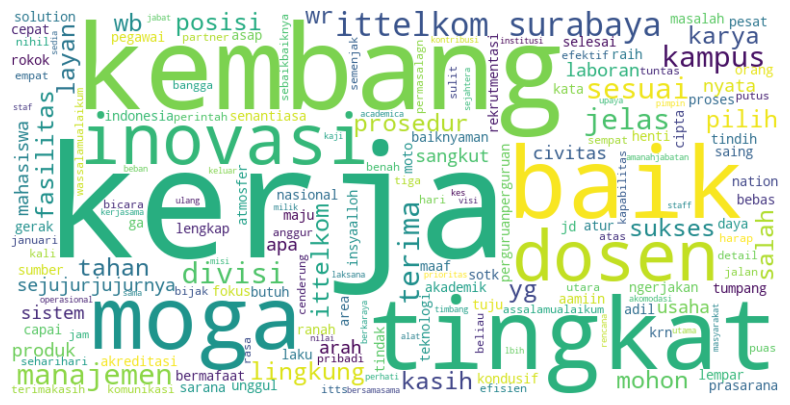

In [54]:
all_textdf20i = ' '.join([' '.join(text) for text in df20i['text_preprocessed']])

# Buat WordCloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_textdf20i)

# Plot WordCloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [55]:
target_word = 'kerja'
sentences_with_word = get_sentences_with_word(df20i, target_word)
print(f"Sentences containing '{target_word}':")
print(f"jumlah komentar: {len(sentences_with_word)}")
for sentence in sentences_with_word:
    print(sentence)
    print(" ")

Sentences containing 'kerja':
jumlah komentar: 5
sudah baik saling kerja sama untuk memberikan yang terbaik lagi
 
assalamualaikum wr wb pada kesempatan kali ini saya ingin mengutarakan dengan sejujurjujurnya tentang yang terjadi di keseharian saya dan pada divisi saya pribadi permasalagn yang pertama adalah tidak ada arahan yang jelas untuk saya dalam pekerjaan seharihari tentang posisi saya sebagai laboran sangat tidak jelas kedua komunikasi pekerjaan yang sangat sulit bagi saya kepada atasan belum membicarakan masalah kapabilitas beliau ketiga partner yang selalu memberikan perintah tanpa penjelasan yang detail dan saya cenderung selalu mengerjakan pekerjaan ketika diminta yang bersangkutan jika tidak sudah dipastikan saya menganggur saat jam kerja keempat sistem manajemen divisi saya yang nihil tidak ada kejelasan tentang perbaikan manajemen pekerjaan yang lebih efektif dan efisien dalam bekerja membuat pekerjaan yang dikerjakan sangat tidak terarah berikut adalah pernyataan saya a

## 2021

### Keseluruhan

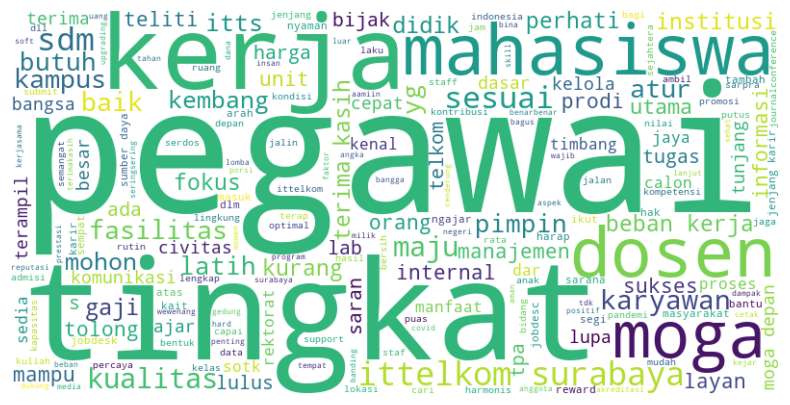

In [56]:
all_text21 = ' '.join([' '.join(text) for text in df21['text_preprocessed']])

# Buat WordCloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_text21)

# Plot WordCloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [57]:
target_word = 'pegawai'
sentences_with_word = get_sentences_with_word(df21, target_word)
print(f"Sentences containing '{target_word}':")
print(f"jumlah komentar: {len(sentences_with_word)}")
for sentence in sentences_with_word:
    print(sentence)
    print(" ")

Sentences containing 'pegawai':
jumlah komentar: 23
seluruh fasilitas kampus yang disediakan untuk pegawai sangat baik dan kampus ini menjadi kebanggaan untuk saya
 
semoga aspek manajemen sdm bisa ditingkatkan supaya setiap pegawai semakin termotivasi  berlomba untuk mencapai kemampuan maksimal
 
dengan kondisi pandemi seperti saat ini yaitu angka penularan covid demakin parah khususnya di surabaya maka seharusnya pimpinan dapat memberikan kebijakan seperti rutin rapidswab untuk para pegawainya mengingat kondisi sekarang masih dilakukan wfo atau jika tdk ada dana untuk rapid maka sebaiknya ada kebijakan full wfh dalam sementara waktu sampai kondisi benarbenar aman daripada harus menunggu ada yg positif covid terlebih dahulu mohon untuk dipertimbangkan saya mohon kesehatan tidak mainmain
 
semoga menjadi institusi yang dapat mencetak dan membentuk karakter sdm yang terampil dan bermanfaat bagi bangsa indonesia serta dapat memberikan kesempatan yang lebih bagi para karyawan untuk melaku

### Capex

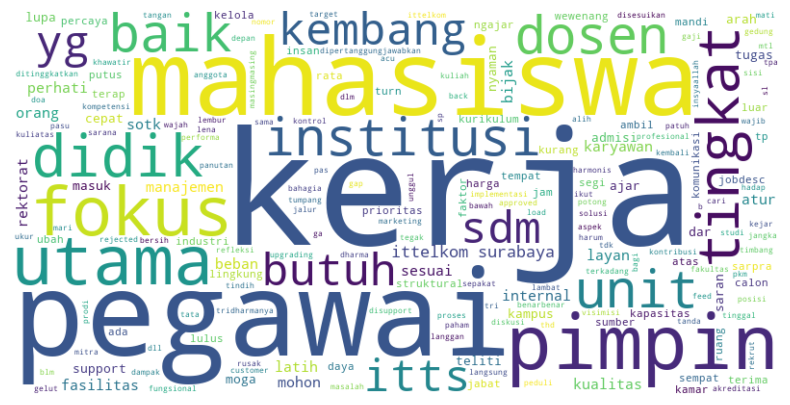

In [58]:
all_text21c = ' '.join([' '.join(text) for text in df21c['text_preprocessed']])

# Buat WordCloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_text21c)

# Plot WordCloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [59]:
target_word = 'kerja'
sentences_with_word = get_sentences_with_word(df21c, target_word)
print(f"Sentences containing '{target_word}':")
print(f"jumlah komentar: {len(sentences_with_word)}")
for sentence in sentences_with_word:
    print(sentence)
    print(" ")

Sentences containing 'kerja':
jumlah komentar: 7
suatu hal yang baik kita fokus dalam penerimaan mahasiswa baru dan baik juga fokus pada pencarian mitra untuk penempatan lulusan atau calon lulusan namun hendaknya yang tidak boleh kita lupakan dan harusnya lebih kita fokuskan adalah meningkatkan kualitas pendidikan dan kompetensi mahasiswa kita jangan sampai proses kerja kita yang utama sebagai institusi pendidikan tertinggal kualitasnya karena akan berdampak pada jangka panjang
 
banyak pekerjaan diluar beban kinerja dosen yang sudah di sepakati perlu diatur lebih lanjut untuk meningkatkan faktor kebahagiaan dalam bekerja
 
mohon load kerjanya diperhatikan lagi oleh pimpinan memang kita harus selalu ambil kesempatan yang ada tapi tidak semua kesempatan dapat kita geluti secara bersamaan
 
kebijakan yg berubah dan belum jelas tata kelola perlu diperbaiki agar pegawai nyaman beban kerja yg blm merata pegawai bekerja pada jam kerja hingga diluar jam kerja lembur dlm melayani customer teta

### Opex

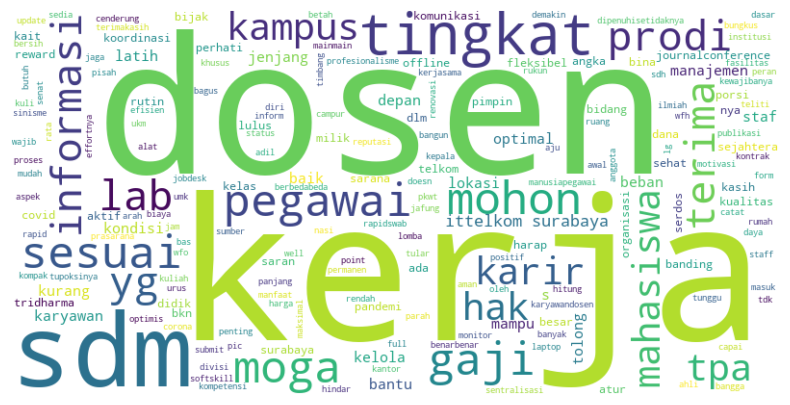

In [60]:
all_text21o = ' '.join([' '.join(text) for text in df21o['text_preprocessed']])

# Buat WordCloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_text21o)

# Plot WordCloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [61]:
target_word = 'dosen'
sentences_with_word = get_sentences_with_word(df21o, target_word)
print(f"Sentences containing '{target_word}':")
print(f"jumlah komentar: {len(sentences_with_word)}")
for sentence in sentences_with_word:
    print(sentence)
    print(" ")

Sentences containing 'dosen':
jumlah komentar: 11
hak tpa dalam mendapatkan softskill untuk meningkatan kompetensi dan kemampuan dirinya untuk kepentingan ittelkom surabaya tidak dikelola baik oleh sdm pengelolaan karir sdm lebih cenderung ke dosen baiknya hak yang dimiliki tpa juga ikut dipenuhisetidaknya effortnya ada
 
kekurangan sdm prodi karena diperbantukan di institusi ada beberapa pegawai tertentu yang beban kerja jauh lebih rendah dibanding saya banyak sekali beban kerja yang tidak bisa saya catatkan ke dalam form beban kerja seperti pic pendirian prodi baru pembina ukm dan keanggotaan senat tidaklah pantas seorang dosen dengan jenjang pendidikan tinggi dan keahlian khusus diberikan nasi bungkus dengan porsi kecil bahkan kuli bangunan di rumah saya saat renovasi porsinya lebih banyak
 
kurang meratanya pekerjaan antar setiap dosen perlu adanya perhitungan kinerja point yang jelas sehingga adil
 
sampai sejauh ini kampus kita sdh memiliki lebih dari  mahasiswa yg artinya kita b

### Institusi

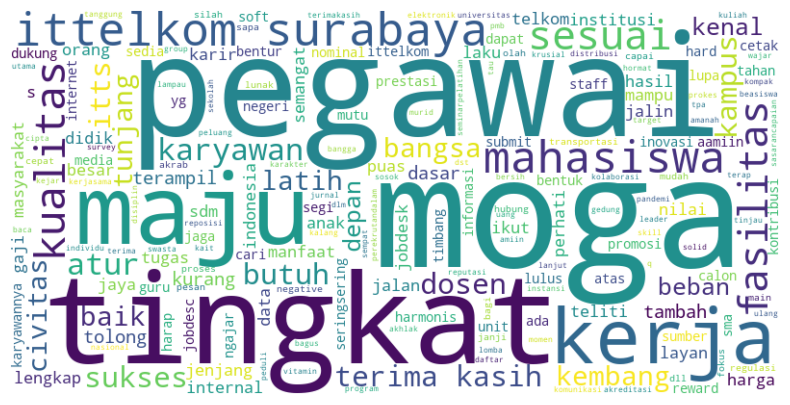

In [62]:
all_text21i = ' '.join([' '.join(text) for text in df21i['text_preprocessed']])

# Buat WordCloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_text21i)

# Plot WordCloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [63]:
target_word = 'pegawai'
sentences_with_word = get_sentences_with_word(df21i, target_word)
print(f"Sentences containing '{target_word}':")
print(f"jumlah komentar: {len(sentences_with_word)}")
for sentence in sentences_with_word:
    print(sentence)
    print(" ")

Sentences containing 'pegawai':
jumlah komentar: 8
seluruh fasilitas kampus yang disediakan untuk pegawai sangat baik dan kampus ini menjadi kebanggaan untuk saya
 
semoga menjadi institusi yang dapat mencetak dan membentuk karakter sdm yang terampil dan bermanfaat bagi bangsa indonesia serta dapat memberikan kesempatan yang lebih bagi para karyawan untuk melakukan pelatihan baik secara soft skill maupun hard dan yang lebih utama memberikan seminarpelatihan yang berkaitan dengan akhlak para pegawai sesuai dengan program kerja yang ada di telkom group
 
semoga ittelkom surabaya dapat lebih tegas menerapkan peraturan yang berlaku sehingga semua pegawai lebih disiplin dan bertanggung jawab untuk turut memajukan ittelkom surabaya
 
lebih memperhatikan keluhan yang dialami oleh para pegawainya
 
lebih tegas dalam merapkan aturan kedisplinan pemerataan beban kerja semua pegawai dan meningkatkan keharmonisan kerja antar pegawai sehingga semua dapat bersinergi bersama meninggkatkan kemajuan it

## 2022

### Keseluruhan

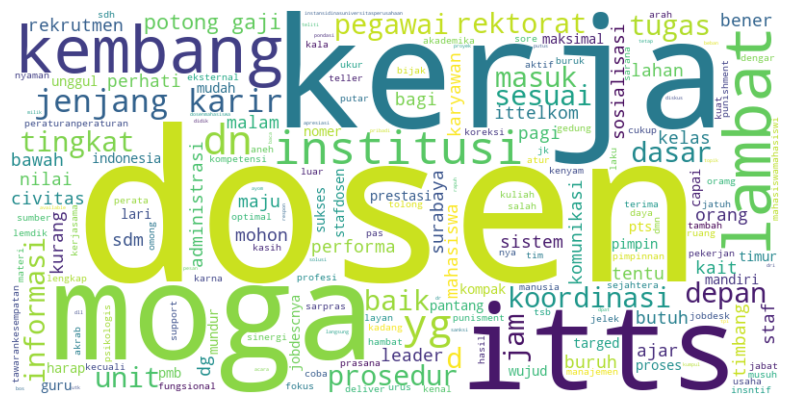

In [64]:
all_text22 = ' '.join([' '.join(text) for text in df22['text_preprocessed']])

# Buat WordCloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_text22)

# Plot WordCloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [65]:
target_word = 'dosen'
sentences_with_word = get_sentences_with_word(df22, target_word)
print(f"Sentences containing '{target_word}':")
print(f"jumlah komentar: {len(sentences_with_word)}")
for sentence in sentences_with_word:
    print(sentence)
    print(" ")

Sentences containing 'dosen':
jumlah komentar: 6
seharusnya proses rekrutmen stafdosen sesuai prosedur agar sdm yang bekerja di ittelkom surabaya dapat bekerja secara maksimal sesuai dengan kebutuhan dan jobdescnya
 
dosen bukan sebagai pelayan administrasi yang harus datang pagi tidak seperti teller atau petugas administrasi dmn jk terlambat akan terhambat dg yang lain dosen terlambat bukan berarti performa dosen tsb jelek
 
terkait pemotongan gaji karena terlambat menurut saya kurang pas karena kita dosen bukan buruh yang jam kerjanya pasti dosen sendiri jam kerjanya tidak pasti kadang ada perkuliahan lebih awal atau bahkan ada kelas sore atau malam yg sdh diluar jam kerja yg ditentukan belum lagi kalau malam harus koreksi atau buat materi mohon dipertimbangkan lagi  mohon pimpinnan lebih mempertimbangkan masukan dari bawahannya
 
seharusnya pekerjaan sebagai dosen bukan diukur dari datang pagi terlambat atau tidak apalagi dengan adanya punisment pemotongan gaji itu agak aneh untuk p

### Capex

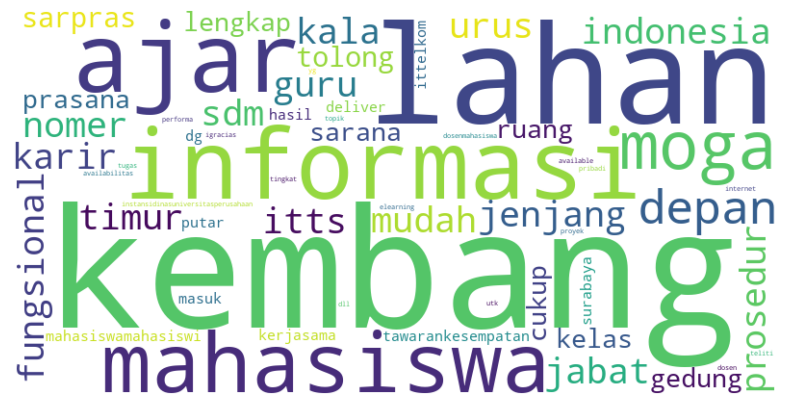

In [66]:
all_text22c = ' '.join([' '.join(text) for text in df22c['text_preprocessed']])

# Buat WordCloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_text22c)

# Plot WordCloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [67]:
target_word = 'informasi'
sentences_with_word = get_sentences_with_word(df22c, target_word)
print(f"Sentences containing '{target_word}':")
print(f"jumlah komentar: {len(sentences_with_word)}")
for sentence in sentences_with_word:
    print(sentence)
    print(" ")

Sentences containing 'informasi':
jumlah komentar: 2
urusan jenjang karir jabatan fungsional sebaiknya ada prosedur yang jelas dan informasi yang jelas dan berkala dari sdm
 
perlu deliver informasi seputar tawarankesempatan dari hasil kerjasama dg instansidinasuniversitasperusahaan yg dapat menjadi lahan available utk penelitian pribadi dosen  topik tugas akhir mahasiswa  proyek dosenmahasiswa dll
 


### Opex

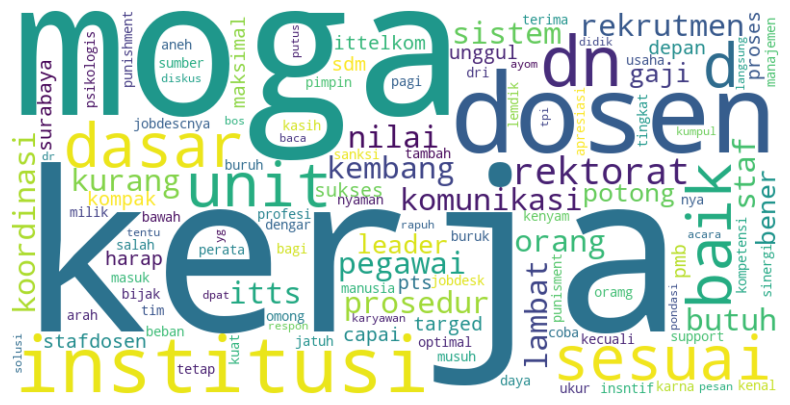

In [68]:
all_text22o = ' '.join([' '.join(text) for text in df22o['text_preprocessed']])

# Buat WordCloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_text22o)

# Plot WordCloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [69]:
target_word = 'kerja'
sentences_with_word = get_sentences_with_word(df22o, target_word)
print(f"Sentences containing '{target_word}':")
print(f"jumlah komentar: {len(sentences_with_word)}")
for sentence in sentences_with_word:
    print(sentence)
    print(" ")

Sentences containing 'kerja':
jumlah komentar: 5
seharusnya proses rekrutmen stafdosen sesuai prosedur agar sdm yang bekerja di ittelkom surabaya dapat bekerja secara maksimal sesuai dengan kebutuhan dan jobdescnya
 
perkuat komunikasi dan kenyaman kerja
 
perlunya insntif tambahan untuk tiap pekerjaan yang diberikan
 
seharusnya pekerjaan sebagai dosen bukan diukur dari datang pagi terlambat atau tidak apalagi dengan adanya punisment pemotongan gaji itu agak aneh untuk profesi sebagai dosen di perusahaan mana pun tidak sampai ada punishment pemotongan gaji kecuali untuk pekerjaan buruh harusnya manajemen tidak membuat kebijakan secara sepihak tanpa mau mendengarkan bawahan hal ini membuat secara psikologis pegawai cukup tidak nyaman
 
beban kerja yang diberikan cukup banyak tetapi apresiasi dri institusi tidak ada  penetapan sanksi terlambat bagi dosen secara prosedur tidak sesuai dn membuat rasa kepemilikan karyawan atas institusinya sangat berkurang bukannya dalam institusi itu perl

### Institusi

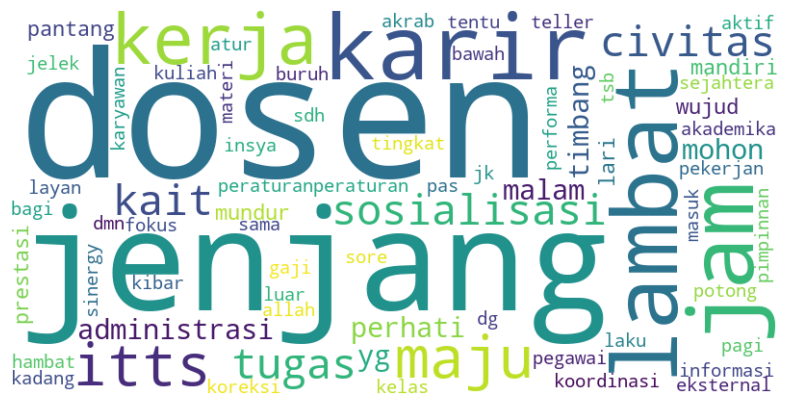

In [70]:
all_text22i = ' '.join([' '.join(text) for text in df22i['text_preprocessed']])

# Buat WordCloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_text22i)

# Plot WordCloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [71]:
target_word = 'dosen'
sentences_with_word = get_sentences_with_word(df22i, target_word)
print(f"Sentences containing '{target_word}':")
print(f"jumlah komentar: {len(sentences_with_word)}")
for sentence in sentences_with_word:
    print(sentence)
    print(" ")

Sentences containing 'dosen':
jumlah komentar: 2
dosen bukan sebagai pelayan administrasi yang harus datang pagi tidak seperti teller atau petugas administrasi dmn jk terlambat akan terhambat dg yang lain dosen terlambat bukan berarti performa dosen tsb jelek
 
terkait pemotongan gaji karena terlambat menurut saya kurang pas karena kita dosen bukan buruh yang jam kerjanya pasti dosen sendiri jam kerjanya tidak pasti kadang ada perkuliahan lebih awal atau bahkan ada kelas sore atau malam yg sdh diluar jam kerja yg ditentukan belum lagi kalau malam harus koreksi atau buat materi mohon dipertimbangkan lagi  mohon pimpinnan lebih mempertimbangkan masukan dari bawahannya
 


## 2023

### Keseluruhan

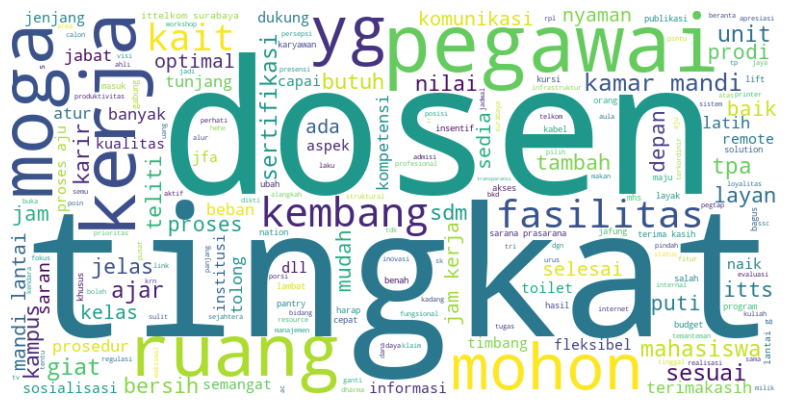

In [72]:
all_text23 = ' '.join([' '.join(text) for text in df23['text_preprocessed']])

# Buat WordCloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_text23)

# Plot WordCloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [73]:
target_word = 'dosen'
sentences_with_word = get_sentences_with_word(df23, target_word)
print(f"Sentences containing '{target_word}':")
print(f"jumlah komentar: {len(sentences_with_word)}")
for sentence in sentences_with_word:
    print(sentence)
    print(" ")

Sentences containing 'dosen':
jumlah komentar: 28
perlu program peningkatan pengembangan sdm dosen
 
terus tingkatkan kualitas pelayanan fasilitas dan kesejahteraan ke seluruh dosen dan tpa
 
memberikan ruang bagi dosen baru dalam mengenal norma peraturan standar dan ketentuan yang diterapkan oleh ittelkom surabaya
 
toilet untuk dosen sendiri bukan untuk umum mhs krn sangat kotor adanya fasilitas pantry umum untuk dosen tersedianya ruangan untuk ibu menyusui pumping ruang dosen sempit apalagi kalo ada mhs bimbingandemo semua dosen ada demo program jadinya tdk kondusif
 
mohon untuk dibantu percepatan penyelesaian ruangan puti yang baru supaya temanteman puti nyaman dalam menyelesaikan pekerjaan mohon untuk budget pantry untuk puti bisa ditambah karena sebelum tengah bulan stok pangan pantry puti sudah mengkhawatirkan mohon dipertimbangkan reward bagi tpa yang berhasil menyelesaikan sertifikasi supaya menjadi faktor penyemangat perlu adanya kejelasan jenjang karir bagi tpa yang sudah m

### Capex

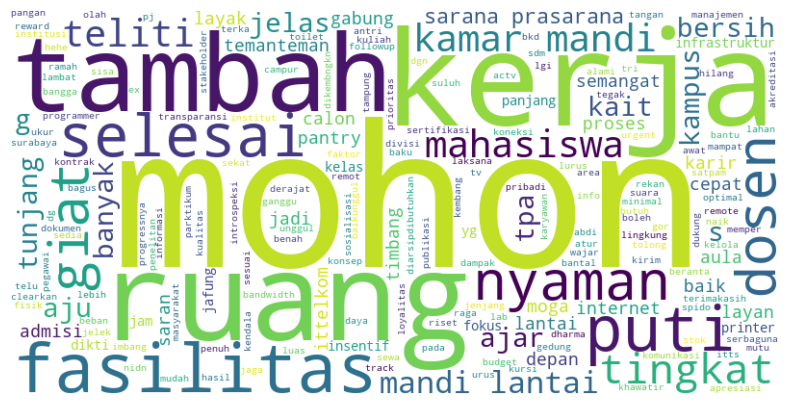

In [74]:
all_text23c = ' '.join([' '.join(text) for text in df23c['text_preprocessed']])

# Buat WordCloud

wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_text23c)

# Plot WordCloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [75]:
target_word = 'dosen'
sentences_with_word = get_sentences_with_word(df23c, target_word)
print(f"Sentences containing '{target_word}':")
print(f"jumlah komentar: {len(sentences_with_word)}")
for sentence in sentences_with_word:
    print(sentence)
    print(" ")

Sentences containing 'dosen':
jumlah komentar: 5
mohon untuk dibantu percepatan penyelesaian ruangan puti yang baru supaya temanteman puti nyaman dalam menyelesaikan pekerjaan mohon untuk budget pantry untuk puti bisa ditambah karena sebelum tengah bulan stok pangan pantry puti sudah mengkhawatirkan mohon dipertimbangkan reward bagi tpa yang berhasil menyelesaikan sertifikasi supaya menjadi faktor penyemangat perlu adanya kejelasan jenjang karir bagi tpa yang sudah menyelesaikan s dan tidak ingin jadi dosen supaya bisa menambah semangat bagi temanteman tpa yang masih s untuk lanjut s
 
ruang dosen butuh untuk disekat kursi kerja yang lebih nyaman masih tegak lurus  derajat dan bantalan yang tidak nyaman satpam yang lebih ramah
 
menambah insentif kepada dosen yang melebihi beban kerja sesuai bkd  mempermudah pengajuan dan menambah insentif publikasi penelitian
 
mohon diperbanyak penyuluhan jafung dosen
 
pengelolaan sdm perlu dikembngkn lgi termasuk yg berkaitan dgn aturan perdosenan 

### Opex

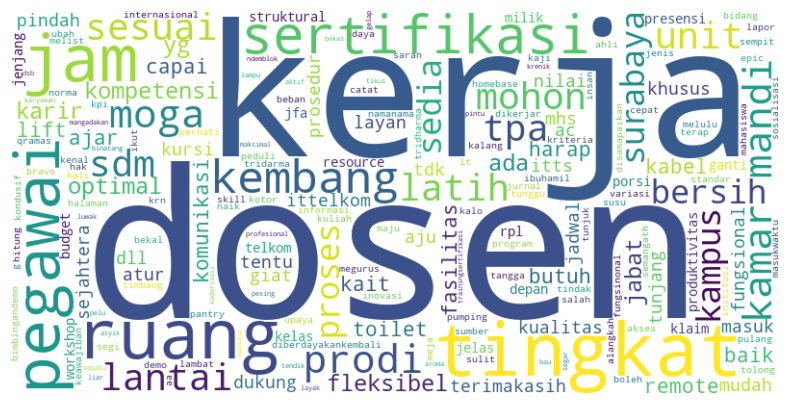

In [76]:
all_text23o = ' '.join([' '.join(text) for text in df23o['text_preprocessed']])

# Buat WordCloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_text23o)

# Plot WordCloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [77]:
target_word = 'dosen'
sentences_with_word = get_sentences_with_word(df23o, target_word)
print(f"Sentences containing '{target_word}':")
print(f"jumlah komentar: {len(sentences_with_word)}")
for sentence in sentences_with_word:
    print(sentence)
    print(" ")

Sentences containing 'dosen':
jumlah komentar: 12
terus tingkatkan kualitas pelayanan fasilitas dan kesejahteraan ke seluruh dosen dan tpa
 
memberikan ruang bagi dosen baru dalam mengenal norma peraturan standar dan ketentuan yang diterapkan oleh ittelkom surabaya
 
toilet untuk dosen sendiri bukan untuk umum mhs krn sangat kotor adanya fasilitas pantry umum untuk dosen tersedianya ruangan untuk ibu menyusui pumping ruang dosen sempit apalagi kalo ada mhs bimbingandemo semua dosen ada demo program jadinya tdk kondusif
 
memperbaiki kinerja unit sdm yang sulit untuk komunikasi dan melaporkan proses dalam megurus pindah homebase dan jabatan fungsional  bukan hanya keawajiban dosen untuk sertifikasi dan jabatan fungsinonal saja yang dikerjar tapi hak agar cepat diberikan seperti tunjangan  tunjangan jabatan aa dosen menunggu hingga  tahun juga belum diberikan
 
proses pengajuan jfa terlalu lama di sdm semoga kedepannya dapat lebih baik lagi mengingat jfa dosen juga penting bagi prodi
 
s

### Institusi

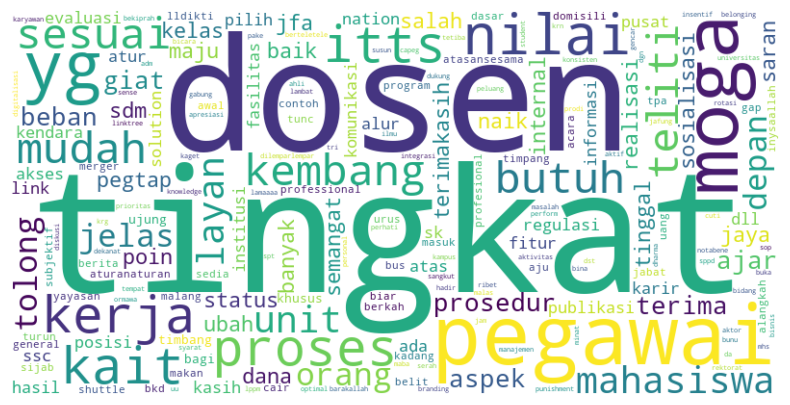

In [78]:
all_text23i = ' '.join([' '.join(text) for text in df23i['text_preprocessed']])

# Buat WordCloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_text23i)

# Plot WordCloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [79]:
target_word = 'tingkat'
sentences_with_word = get_sentences_with_word(df23i, target_word)
print(f"Sentences containing '{target_word}':")
print(f"jumlah komentar: {len(sentences_with_word)}")
for sentence in sentences_with_word:
    print(sentence)
    print(" ")

Sentences containing 'tingkat':
jumlah komentar: 9
lebih ditingkatkan dan ditegaskan kembali terkait aturanaturan yang ada di itts
 
peningkatan integrasi kegiatan dan segala aspek universitas rektorat dekanat prodi mahasiswa dll  pemilihan aktor sesuai dengan keahlian dibidangnya  peningkatan personal branding dan sense of belonging  prioritas dalam fasilitas dan penelitian atau keilmuan perlu ditingkatkan
 
namun apresiasi tidak jelas tingkat beban kerja dosen cukup tinggi dengan beban mengajar dan beban di luar tri dharma namun semoga itts kedepannya bisa mengatasi permasalahan yang lalu dan yang akan datang
 
digitalisasi proses bisnis lebih ditingkatkan perlu kejelasan alur dan pembinaan terkait peningkatan karir penilaian bagi karyawan yg tidak perform perlu diperhatikan
 
sistem pelayanan sdm untuk pegawai sebaiknya lebih ditingkatkan untuk kemudahan akses informasi
 
kebersihan lebih ditingkatkan lagi
 
secara umum sudah sangat baik beberapa yg masih baik perlu ditingkatkan
 
t